In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
import datetime as dt

In [4]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

In [5]:
# Load the dataset
file_path = r'C:\Users\AX2B\Desktop\apple_tp\apple_forcasting\World-Stock-Prices-Dataset.csv'  # Update with your file path
data = pd.read_csv(file_path)

In [6]:
# defining the time periode of our study
start_date = '2018-09-15'
end_date = '2023-09-03'

In [7]:
def isolate_column(data, brand_name, column_name):
    """
    Process stock data for a given brand and column, and calculate weekly means.

    Parameters:
    data (DataFrame): The DataFrame containing stock information.
    brand_name (str): The brand name to filter the data.
    column_name (str): The name of the column to analyze.
    start_date (str): The start date for the analysis in 'YYYY-MM-DD' format.
    end_date (str): The end date for the analysis in 'YYYY-MM-DD' format.

    Returns:
    DataFrame: A DataFrame with processed data.
    """
    # Filter data for the specified brand
    brand_df = data[data['Brand_Name'].str.lower() == brand_name.lower()]

    # Select only the specified column and the 'Date' column
    selected_df = brand_df[['Date', column_name]]

    # Convert 'Date' to datetime and sort by 'Date'
    selected_df['Date'] = pd.to_datetime(selected_df['Date'].str.split(" ").str[0])
    selected_df.sort_values('Date', inplace=True)

    # Set 'Date' as index and remove duplicates
    selected_df.set_index('Date', inplace=True)
    selected_df = selected_df[~selected_df.index.duplicated(keep='first')]

    # Resample and calculate weekly mean
    weekly_data = selected_df.resample('W').mean()

    # Filter data within the specified date range
    weekly_data = weekly_data.loc[start_date:end_date]

    return weekly_data


In [8]:
# Display unique values with their frequencies
print(data['Brand_Name'].value_counts())

Brand_Name
foot locker            5969
microsoft              5969
adobe                  5969
jpmorgan chase & co    5969
marriott               5969
                       ... 
peloton                1005
zoominfo                832
airbnb                  700
roblox                  640
coinbase                616
Name: count, Length: 61, dtype: int64


In [9]:
# Example usage
brand_name = 'apple'
column_name = 'Close'
apple_close = isolate_column(data, brand_name, column_name)
apple_close.head()

C:\Users\AX2B\AppData\Local\Temp\ipykernel_26200\3782093789.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df['Date'] = pd.to_datetime(selected_df['Date'].str.split(" ").str[0])
C:\Users\AX2B\AppData\Local\Temp\ipykernel_26200\3782093789.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df.sort_values('Date', inplace=True)


,Close
Date,
2018-09-16,53.321823
2018-09-23,52.300876
2018-09-30,53.350076
2018-10-07,54.633438
2018-10-14,52.845827


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


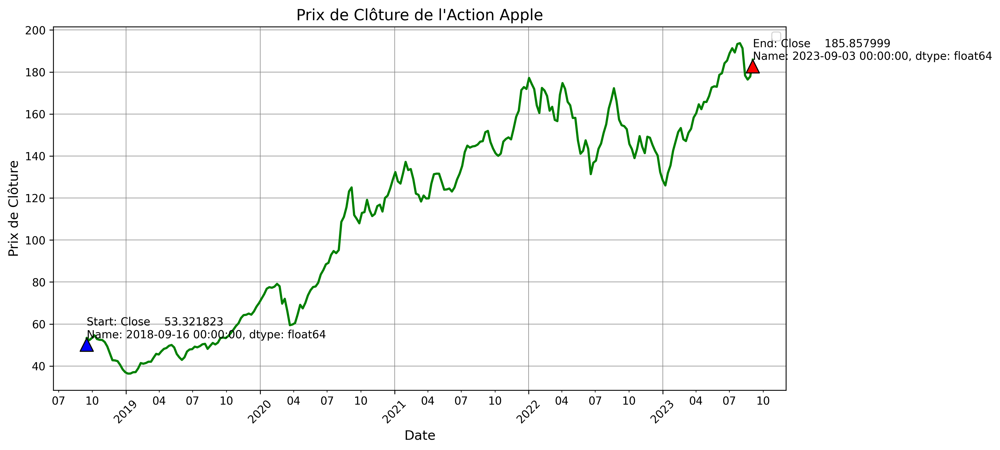

In [10]:
import matplotlib.dates as mdates

# Assuming apple_close is a pandas Series or DataFrame column with closing prices

# Set the figure size for HD resolution and higher DPI for better quality
plt.figure(figsize=(12, 6), dpi=300)

# Plotting apple_close with improved aesthetics
plt.plot(apple_close, color='green', linewidth=2, linestyle='-')

# Adding annotations for the start and end points
start_date = apple_close.index[0]
end_date = apple_close.index[-1]
start_price = apple_close.iloc[0]
end_price = apple_close.iloc[-1]

plt.annotate(f'Start: {start_price}', xy=(start_date, start_price), xytext=(start_date, start_price),
             arrowprops=dict(facecolor='blue', shrink=0.05))

plt.annotate(f'End: {end_price}', xy=(end_date, end_price), xytext=(end_date, end_price),
             arrowprops=dict(facecolor='red', shrink=0.05))

# Setting the title, labels, and legend
plt.title('Prix de Clôture de l\'Action Apple', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Prix de Clôture', fontsize=12)
plt.legend()

# Adding grid lines for better readability
plt.grid(True, which='major', linestyle='-', linewidth='0.5', color='gray')

# Formatting date labels on the x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.gca().xaxis.set_minor_formatter(mdates.DateFormatter('%m'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_minor_locator(mdates.MonthLocator(bymonthday=1, interval=3))

# Rotating the date labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.show()


In [11]:
# Save the plot as a high-quality PNG file
plt.savefig('apple_stock_price.png', format='png', dpi=300)

<Figure size 640x480 with 0 Axes>

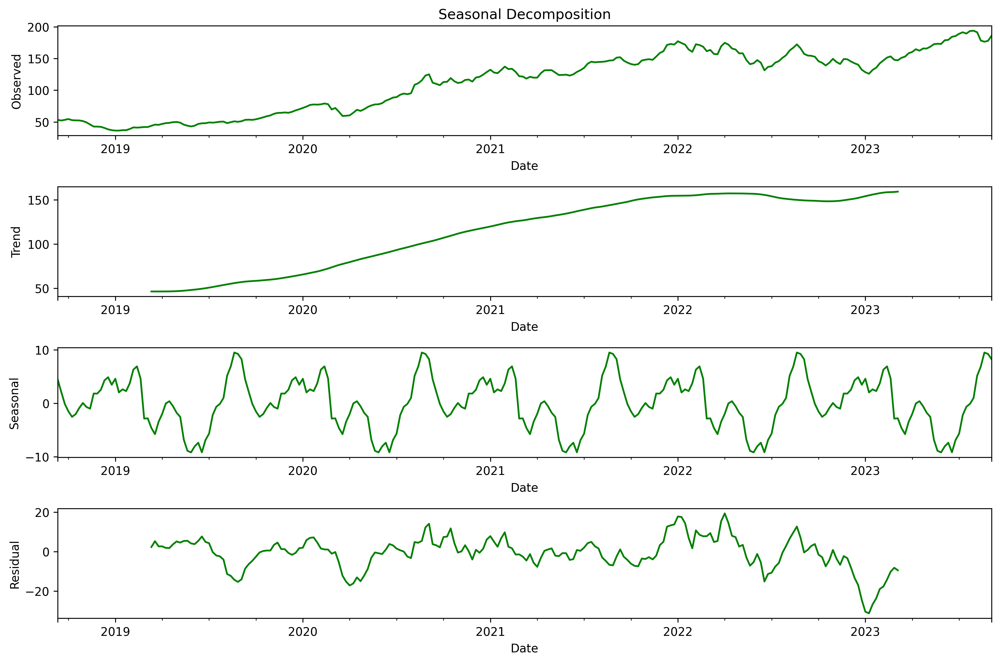

In [12]:
# Perform seasonal decomposition
decomposition = sm.tsa.seasonal_decompose(apple_close, model='additive')

# Set the size and resolution of the plot
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 300

# Get the decomposition plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8))

# Plotting each component with green color
decomposition.observed.plot(ax=ax1, color='green')
ax1.set_ylabel('Observed', color='black')
ax1.set_title('Seasonal Decomposition')

decomposition.trend.plot(ax=ax2, color='green')
ax2.set_ylabel('Trend', color='black')

decomposition.seasonal.plot(ax=ax3, color='green')
ax3.set_ylabel('Seasonal', color='black')

decomposition.resid.plot(ax=ax4, color='green')
ax4.set_ylabel('Residual', color='black')

# Adjusting layout for better display
plt.tight_layout()

# Show the plot
plt.show()


In [13]:
def perform_adf_test(dataframe, column):
    """
    Performs the Augmented Dickey-Fuller test on the specified column of the dataframe.

    Args:
    dataframe (pd.DataFrame): The DataFrame containing the time series data.
    column (str): The column name of the time series to be tested.

    Returns:
    None: The function prints the results of the ADF test.
    """
    # Perform ADF test
    adf_test = adfuller(dataframe[column])
    adf_output = pd.Series(adf_test[0:4], index=['Test Statistic', 'p_value', '#Lags Used', 'Number of Observations Used'])
    
    for key, value in adf_test[4].items():
        adf_output[f'Critical Value ({key})'] = value

    # Print the results of the ADF test
    print(adf_output)

    # Displaying if the series is stationary or not
    p_value = adf_test[1]
    if p_value < 0.05:
        print("\n===> The time series is stationary.")
    else:
        print("\n===> The time series is not stationary.")

In [14]:
perform_adf_test(apple_close, 'Close')

Test Statistic                  -0.626705
p_value                          0.864833
#Lags Used                       1.000000
Number of Observations Used    258.000000
Critical Value (1%)             -3.455953
Critical Value (5%)             -2.872809
Critical Value (10%)            -2.572775
dtype: float64

===> The time series is not stationary.


In [15]:
# Apply differentiation
apple_diff = apple_close['Close'].diff().dropna()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


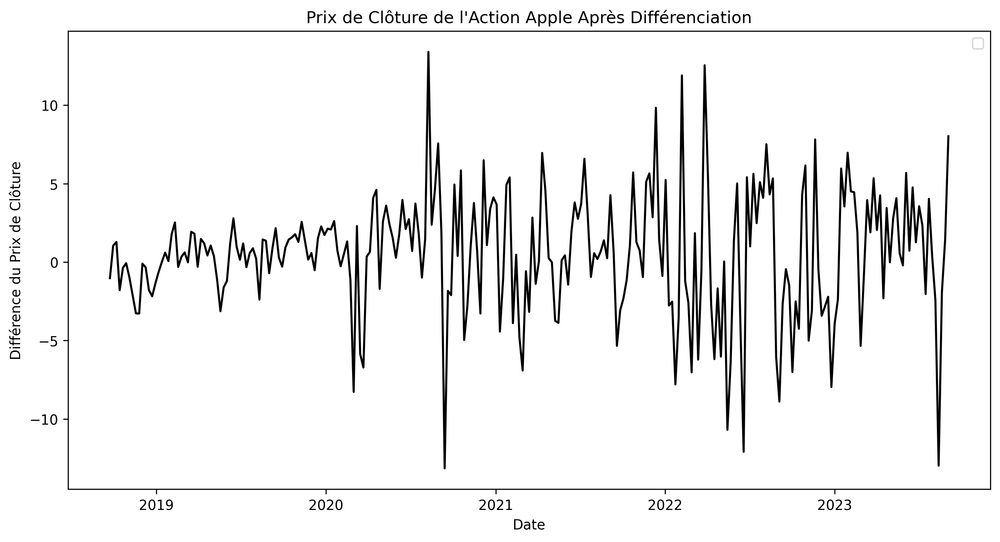

In [16]:
# Plotting the differentiated data
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(apple_diff, color='black')
plt.title('Prix de Clôture de l\'Action Apple Après Différenciation')
plt.xlabel('Date')
plt.ylabel('Différence du Prix de Clôture')
plt.legend()
plt.show()



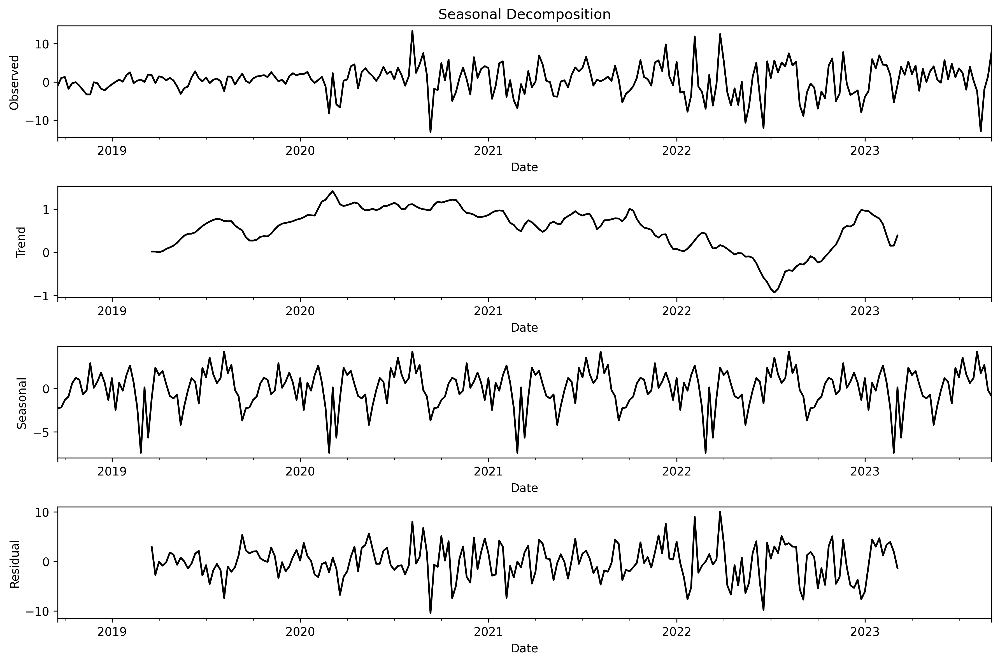

In [17]:
# Seasonal decomposition of the differentiated data
decomposition_diff = sm.tsa.seasonal_decompose(apple_diff, model='additive')
# Set the size and resolution of the plot
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 300

# Get the decomposition plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8))

# Plotting each component with green color
decomposition_diff.observed.plot(ax=ax1, color='black')
ax1.set_ylabel('Observed', color='black')
ax1.set_title('Seasonal Decomposition')

decomposition_diff.trend.plot(ax=ax2, color='black')
ax2.set_ylabel('Trend', color='black')

decomposition_diff.seasonal.plot(ax=ax3, color='black')
ax3.set_ylabel('Seasonal', color='black')

decomposition_diff.resid.plot(ax=ax4, color='black')
ax4.set_ylabel('Residual', color='black')

# Adjusting layout for better display
plt.tight_layout()

# Show the plot
plt.show()

In [18]:
# Perform ADF test on the differentiated data
perform_adf_test(pd.DataFrame(apple_diff), apple_diff.name)

Test Statistic                -1.214597e+01
p_value                        1.610493e-22
#Lags Used                     0.000000e+00
Number of Observations Used    2.580000e+02
Critical Value (1%)           -3.455953e+00
Critical Value (5%)           -2.872809e+00
Critical Value (10%)          -2.572775e+00
dtype: float64

===> The time series is stationary.


In [19]:
def split_time_series(data, column=None, test_percentage=0.10):
    """
    Splits a time series into training and test sets based on the specified test set percentage.

    Args:
    data (pd.DataFrame or pd.Series): The time series data.
    column (str, optional): The column name if data is a DataFrame. Default is None.
    test_percentage (float, optional): The percentage of data to be used as the test set. Default is 0.10 (10%).

    Returns:
    tuple: A tuple containing the training set and the test set.
    """
    # Calculate the number of points for the test set and ensure it's an integer
    n_test = int(len(data) * test_percentage)

    if isinstance(data, pd.DataFrame) and column:
        series_data = data[column]
    elif isinstance(data, pd.Series):
        series_data = data
    else:
        raise ValueError("Data must be a pandas DataFrame or Series")

    # Calculate the number of points for the training set
    n_train = len(series_data) - n_test

    # Split the data into training and test sets
    train_df = series_data.iloc[:n_train]
    test_df = series_data.iloc[-n_test:]

    return train_df, test_df, n_test 


In [20]:
train_df, test_df, n_test = split_time_series(apple_diff, 'Close', 0.10)

In [21]:
train_df.head()

Date
2018-09-23   -1.020947
2018-09-30    1.049200
2018-10-07    1.283363
2018-10-14   -1.787611
2018-10-21   -0.360587
Freq: W-SUN, Name: Close, dtype: float64

In [22]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
import numpy as np

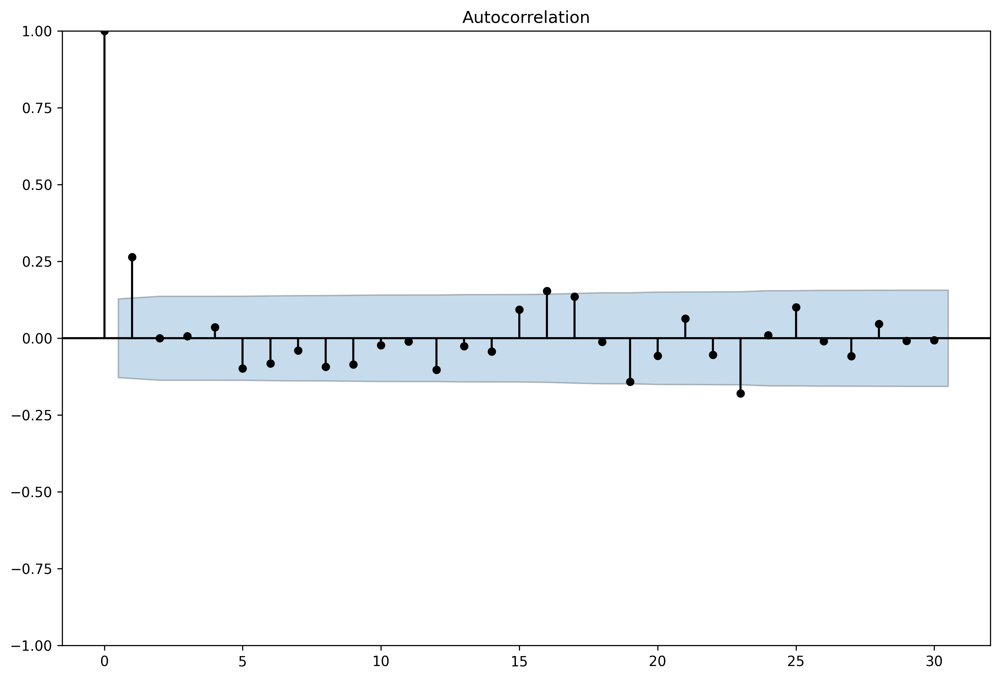

In [23]:
# Plot ACF
fig, ax = plt.subplots()
plot_acf(train_df, lags=30, ax=ax)

# Change the color of the ACF lines to black
for line in ax.get_lines():
    line.set_color('black')

# Optionally, change the color of the confidence interval band
for collection in ax.collections:
    collection.set_edgecolor('black')  # Change the edge color of the confidence interval
    # collection.set_alpha(0.2)  # Adjust transparency as needed

plt.show()


####################*Résultats pour l'odre MA q = 1
                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  234
Model:                 ARIMA(0, 0, 1)   Log Likelihood                -640.133
Date:                Tue, 12 Dec 2023   AIC                           1286.267
Time:                        23:58:49   BIC                           1296.633
Sample:                    09-23-2018   HQIC                          1290.446
                         - 03-12-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4200      0.313      1.343      0.179      -0.193       1.033
ma.L1          0.2808      0.060      4.650      0.000       0.162       0.399


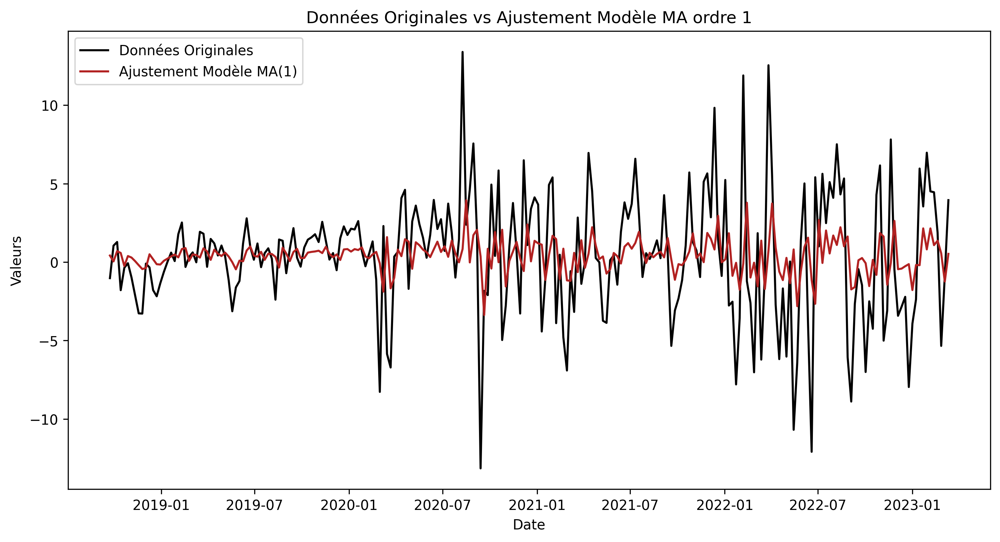

####################*Résultats pour l'odre MA q = 16
                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  234
Model:                ARIMA(0, 0, 16)   Log Likelihood                -631.231
Date:                Tue, 12 Dec 2023   AIC                           1298.461
Time:                        23:58:52   BIC                           1360.657
Sample:                    09-23-2018   HQIC                          1323.538
                         - 03-12-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4124      0.246      1.674      0.094      -0.071       0.895
ma.L1          0.2533      0.071      3.592      0.000       0.115       0.392

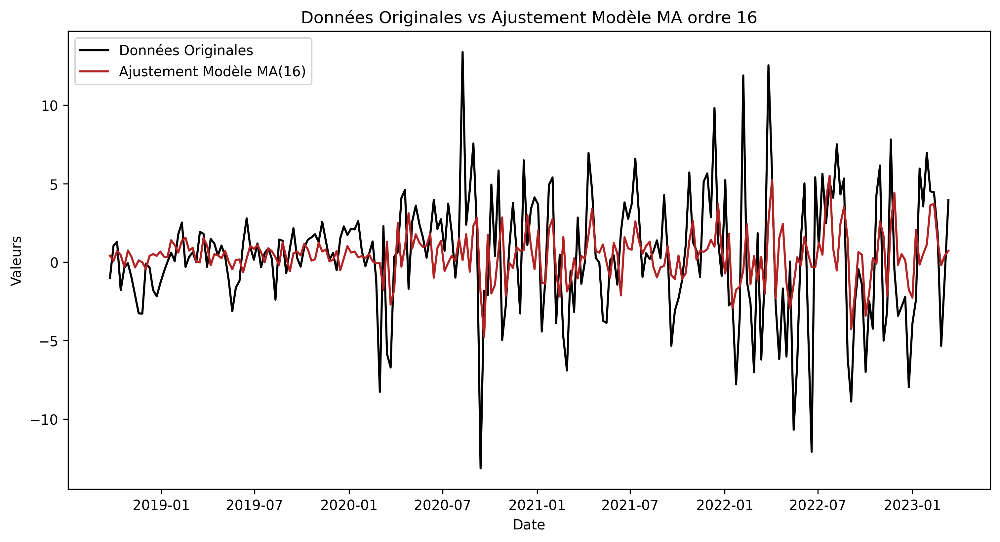

####################*Résultats pour l'odre MA q = 23
                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  234
Model:                ARIMA(0, 0, 23)   Log Likelihood                -626.087
Date:                Tue, 12 Dec 2023   AIC                           1302.175
Time:                        23:58:58   BIC                           1388.558
Sample:                    09-23-2018   HQIC                          1337.004
                         - 03-12-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4416      0.244      1.807      0.071      -0.037       0.921
ma.L1          0.2729      0.070      3.902      0.000       0.136       0.410

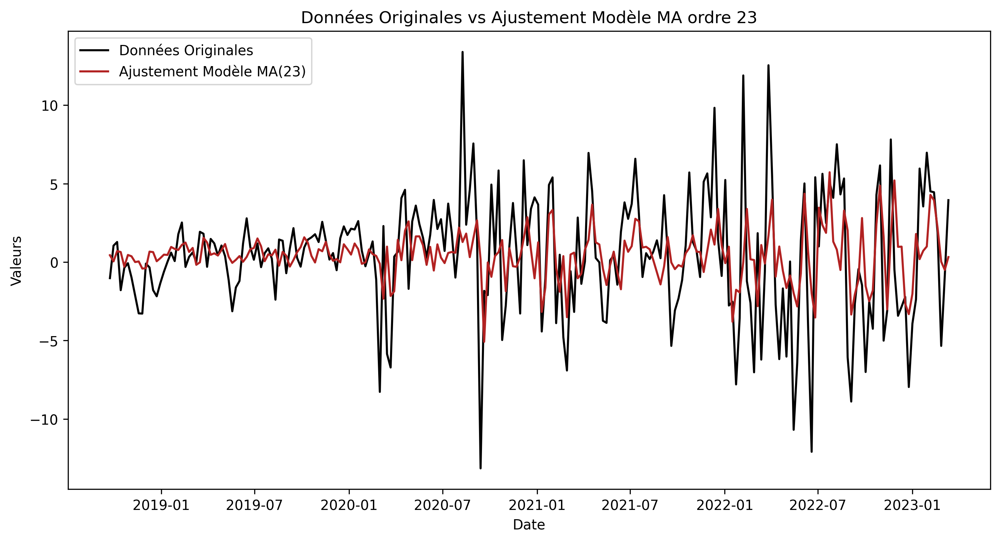

In [24]:
MA_Order = [1, 16, 23]
aic_values = {}

for q in MA_Order:
    print("####################*Résultats pour l'odre MA q =", q)
    model_ma = ARIMA(train_df, order=(0, 0, q))
    results_ma = model_ma.fit()
    
    # Afficher le résumé du modèle
    print(results_ma.summary())

    # Stocker la valeur AIC
    aic_values[q] = results_ma.aic

    # Récupérer les ajustements du modèle
    fitted_values_ma = results_ma.fittedvalues
    
    # Créer le graphique des données et de l'ajustement
    plt.figure(figsize=(12, 6))
    plt.plot(train_df, color='black', label='Données Originales')
    plt.plot(fitted_values_ma, color='firebrick', label='Ajustement Modèle MA(' + str(q) + ')', linestyle='-')
    plt.title('Données Originales vs Ajustement Modèle MA ordre ' + str(q))
    plt.xlabel('Date')
    plt.ylabel('Valeurs')
    plt.legend()
    plt.show()


In [25]:
# Afficher les valeurs AIC pour chaque modèle
print("Valeurs AIC et BIC pour chaque ordre MA :")
for q, aic in aic_values.items():
    print(f"MA({q}): AIC = {aic}")

Valeurs AIC et BIC pour chaque ordre MA :
MA(1): AIC = 1286.2669434574545
MA(16): AIC = 1298.4611765958646
MA(23): AIC = 1302.174904139716


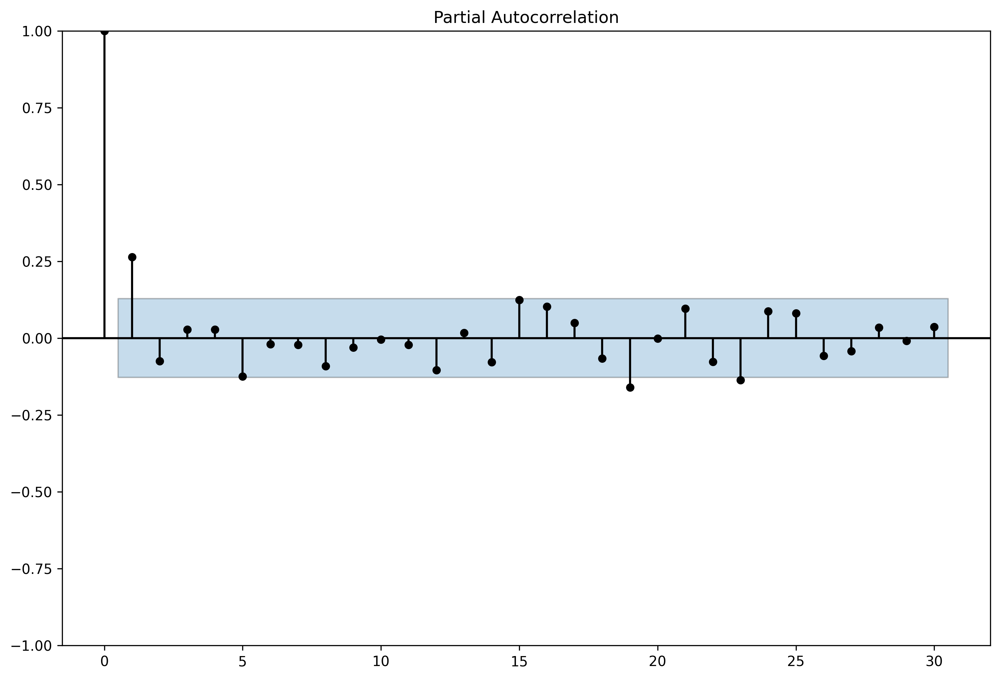

In [26]:
# Plot PACF
fig, ax = plt.subplots()
plot_pacf(train_df, lags=30, ax=ax)

# Change the color of the PACF lines to black
for line in ax.get_lines():
    line.set_color('black')

# If needed, change the color of the confidence interval band
for collection in ax.collections:
    collection.set_edgecolor('black')  # Change the edge color of the confidence interval
    # collection.set_alpha(0.2)  # Adjust transparency as needed

plt.show()


####################*Résultats pour l'odre AR p = 1
                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  234
Model:                 ARIMA(1, 0, 0)   Log Likelihood                -640.795
Date:                Tue, 12 Dec 2023   AIC                           1287.591
Time:                        23:59:01   BIC                           1297.957
Sample:                    09-23-2018   HQIC                          1291.770
                         - 03-12-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4209      0.335      1.255      0.209      -0.236       1.078
ar.L1          0.2635      0.063      4.163      0.000       0.139       0.388


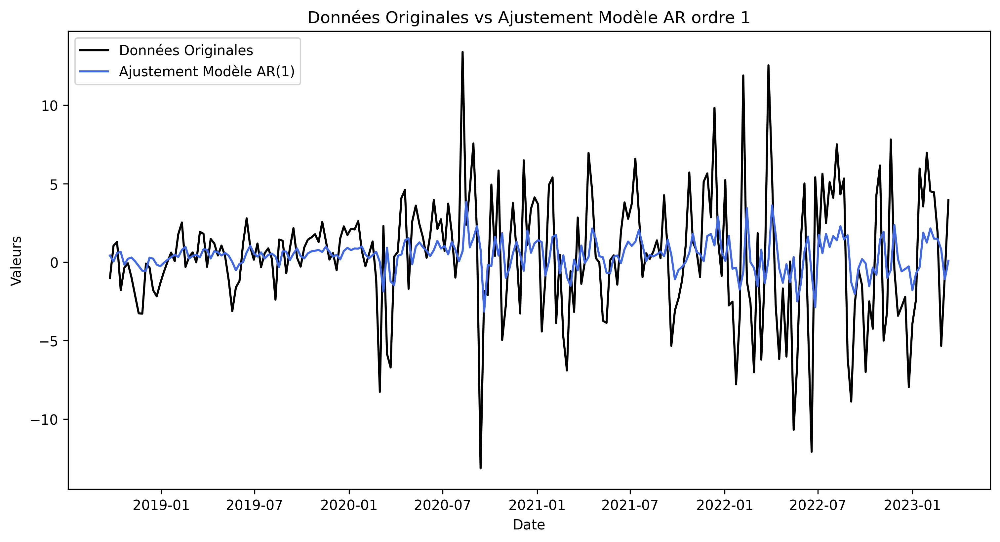

####################*Résultats pour l'odre AR p = 19
                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  234
Model:                ARIMA(19, 0, 0)   Log Likelihood                -627.595
Date:                Tue, 12 Dec 2023   AIC                           1297.190
Time:                        23:59:04   BIC                           1369.752
Sample:                    09-23-2018   HQIC                          1326.447
                         - 03-12-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4213      0.242      1.740      0.082      -0.053       0.896
ar.L1          0.2647      0.071      3.715      0.000       0.125       0.404

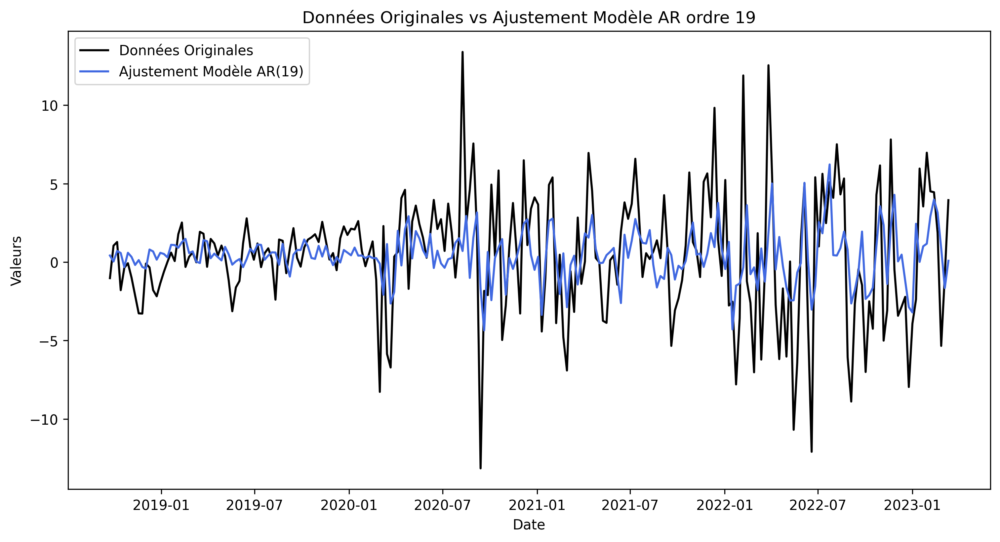

####################*Résultats pour l'odre AR p = 23
                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  234
Model:                ARIMA(23, 0, 0)   Log Likelihood                -623.316
Date:                Tue, 12 Dec 2023   AIC                           1296.632
Time:                        23:59:09   BIC                           1383.015
Sample:                    09-23-2018   HQIC                          1331.462
                         - 03-12-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4389      0.226      1.945      0.052      -0.003       0.881
ar.L1          0.2605      0.074      3.497      0.000       0.114       0.407

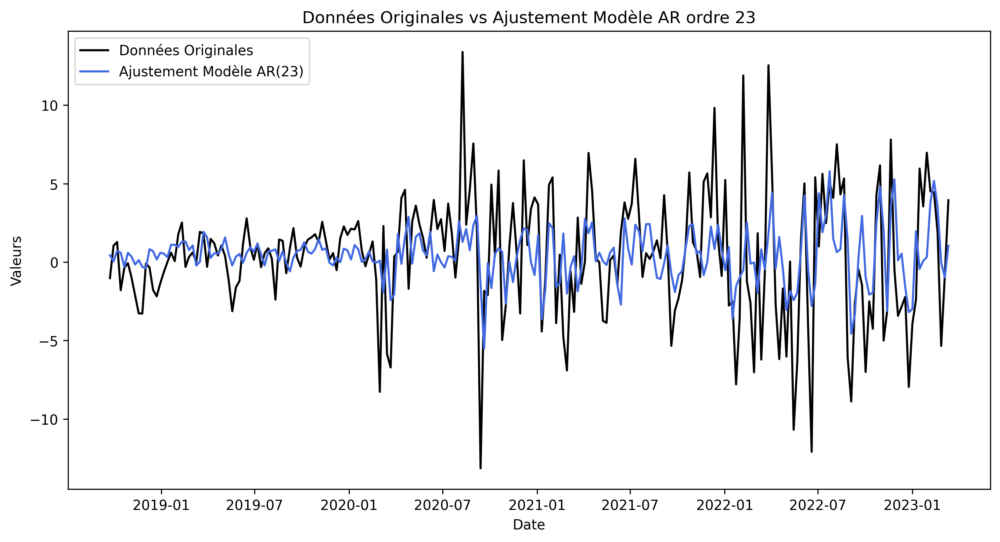

In [27]:
AR_model = [1, 19, 23]
aic_values = {}

for p in AR_model:
    print("####################*Résultats pour l'odre AR p =", p)
    model_ar = ARIMA(train_df, order=(p, 0, 0))
    results_ar = model_ar.fit()
    
    # Afficher le résumé du modèle
    print(results_ar.summary())

    # Stocker la valeur AIC
    aic_values[p] = results_ar.aic

    # Récupérer les ajustements du modèle
    fitted_values = results_ar.fittedvalues
    
    # Créer le graphique
    plt.figure(figsize=(12, 6))
    plt.plot(train_df, color='black', label='Données Originales')
    plt.plot(fitted_values, color='royalblue', linestyle='-', label='Ajustement Modèle AR(' + str(p) + ')')
    plt.title('Données Originales vs Ajustement Modèle AR ordre ' + str(p))
    plt.xlabel('Date')
    plt.ylabel('Valeurs')
    plt.legend()
    plt.show()


In [28]:
# Afficher les valeurs AIC pour chaque modèle
print("Valeurs AIC pour chaque ordre AR :")
for p, aic in aic_values.items():
    print(f"AR({p}): AIC = {aic}")

Valeurs AIC pour chaque ordre AR :
AR(1): AIC = 1287.5908359277582
AR(19): AIC = 1297.189934318425
AR(23): AIC = 1296.6323235016116


In [29]:
def find_best_arima_models(data, max_ar, max_ma):
    """
    Fits ARIMA models with various combinations of AR and MA orders, 
    calculates their AIC values, and returns the best three models.

    Args:
    data (pd.Series): Time series data.
    max_ar (int): Maximum number of AR terms to consider.
    max_ma (int): Maximum number of MA terms to consider.

    Returns:
    pd.DataFrame: DataFrame with model orders and corresponding AIC values,
                  and the top three models based on AIC.
    """
    aic_values = {}

    # Iterate over AR and MA order ranges
    for p in range(max_ar + 1):
        for q in range(max_ma + 1):
            try:
                model = ARIMA(data, order=(p, 0, q))
                results = model.fit()
                aic_values[(p, q)] = results.aic
            except:
                aic_values[(p, q)] = None

    # Convert to DataFrame
    aic_df = pd.DataFrame(list(aic_values.items()), columns=['Order (p,q)', 'AIC'])

    # Sort by AIC values to find the best models
    aic_df = aic_df.sort_values(by='AIC')

    # Extract the top three models
    top_models = aic_df.head(3)

    return aic_df, top_models

In [30]:
warnings.filterwarnings("ignore")  # Ignore convergence warnings
# Assuming 'train_df' is your time series data
aic_matrix, top_three_models = find_best_arima_models(train_df, max_ar=5, max_ma=5)
print("AIC Matrix:\n", aic_matrix)
print("\nTop Three Models:\n", top_three_models)


AIC Matrix:
    Order (p,q)          AIC
1       (0, 1)  1286.266943
20      (3, 2)  1286.315122
6       (1, 0)  1287.590836
2       (0, 2)  1288.235890
12      (2, 0)  1288.238728
7       (1, 1)  1288.241105
32      (5, 2)  1289.218073
8       (1, 2)  1289.615466
3       (0, 3)  1289.871457
18      (3, 0)  1290.075590
13      (2, 1)  1290.166735
30      (5, 0)  1290.212930
4       (0, 4)  1290.277755
14      (2, 2)  1290.451203
9       (1, 3)  1290.913450
11      (1, 5)  1290.915496
26      (4, 2)  1291.055739
22      (3, 4)  1291.117979
31      (5, 1)  1291.171048
27      (4, 3)  1291.388739
29      (4, 5)  1291.628294
5       (0, 5)  1291.636945
24      (4, 0)  1291.867867
15      (2, 3)  1291.950941
28      (4, 4)  1291.955423
19      (3, 1)  1292.055556
10      (1, 4)  1292.067605
17      (2, 5)  1292.749132
25      (4, 1)  1292.818165
21      (3, 3)  1293.537214
33      (5, 3)  1293.670696
16      (2, 4)  1293.783998
23      (3, 5)  1294.329101
34      (5, 4)  1294.664645
35     

In [31]:
def fit_arima_model(data, ar_order, ma_order):
    """
    Fits an ARIMA model and returns the fitted model.

    Args:
    data (pd.Series): Time series data.
    ar_order (int): AR order.
    ma_order (int): MA order.

    Returns:
    The fitted ARIMA model.
    """
    model = ARIMA(data, order=(ar_order, 0, ma_order))
    results = model.fit()
    return results

In [32]:
# Fit the ARIMA model
results_arma = fit_arima_model(train_df, 3, 2) 
results_arma.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Close   No. Observations:                  234
Model:                 ARIMA(3, 0, 2)   Log Likelihood                -636.158
Date:                Tue, 12 Dec 2023   AIC                           1286.315
Time:                        23:59:35   BIC                           1310.502
Sample:                    09-23-2018   HQIC                          1296.067
                         - 03-12-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5112      0.349      1.464      0.143      -0.173       1.195
ar.L1         -0.0920      0.068     -1.362      0.173      -0.224       0.040
ar.L2         -0.8801      0.031    -28.656      0.000      -0.940      -0.820
ar.L3          0.2955      0.065      4.537      0.000       0.168       0.423
ma.L1          0.3688      0.037      9.977      0.000       0.296       0.441
ma.L2          0.9902      0.051     19.533      0.000       0.891       1.090
sigma2        13.3169      1.024     13.004      0.000      11.310      15.324
===================================================================================
Ljung-Box (L1) (Q):                   0.09   Jarque-Bera (JB):                42.23
Prob(Q):                              0.77   Prob(JB):                         0.00
Heteroskedasticity (H):               7.62   Skew:                            -0.09
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.07
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

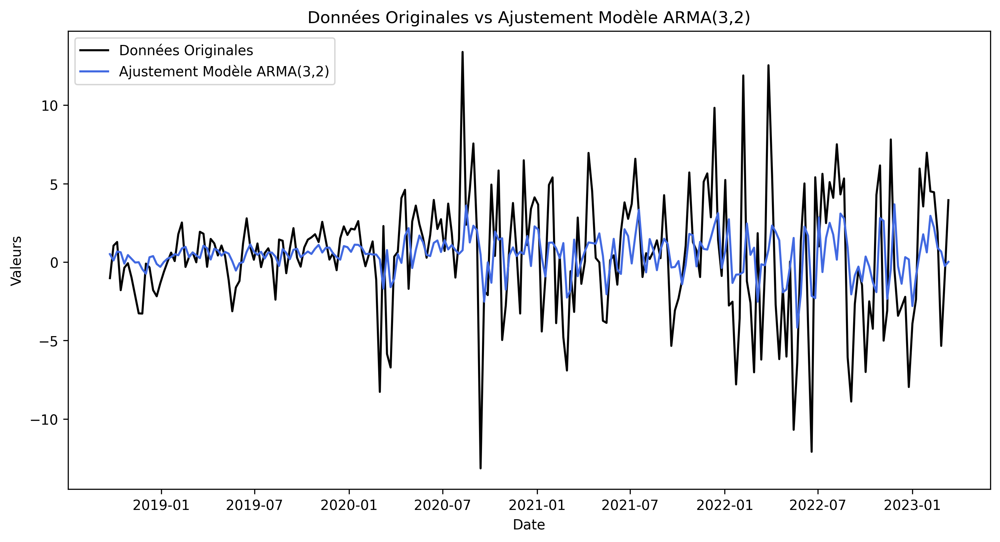

In [33]:
import matplotlib.pyplot as plt

# Extract the fitted values
fitted_values_arma = results_arma.fittedvalues
# Créer le graphique
plt.figure(figsize=(12, 6))
plt.plot(train_df, color='black', label='Données Originales')
plt.plot(fitted_values_arma, color='royalblue', linestyle='-', label='Ajustement Modèle ARMA(3,2)')
plt.title('Données Originales vs Ajustement Modèle ARMA(3,2)')
plt.xlabel('Date')
plt.ylabel('Valeurs')
plt.legend()
plt.show()


In [34]:
def check_residuals_acf(residus, model_type):
    """
    Plots the Autocorrelation Function (ACF) of the residuals of a given model.

    Args:
    residus (pd.Series): The residuals of the model.
    model_type (str): A string indicating the type of model (e.g., 'MA', 'AR', 'ARMA').
    """
    print(f"Autocorrelation résidus {model_type}")
    fig, ax = plt.subplots()
    plot_acf(residus, ax=ax)

    # Change the color of the ACF lines to black
    for line in ax.get_lines():
        line.set_color('black')

    # Optionally, change the color of the confidence interval band
    for collection in ax.collections:
        collection.set_edgecolor('black')  # Change the edge color of the confidence interval
        collection.set_alpha(0.2)  # Adjust transparency as needed

    plt.show()

Autocorrelation résidus MA


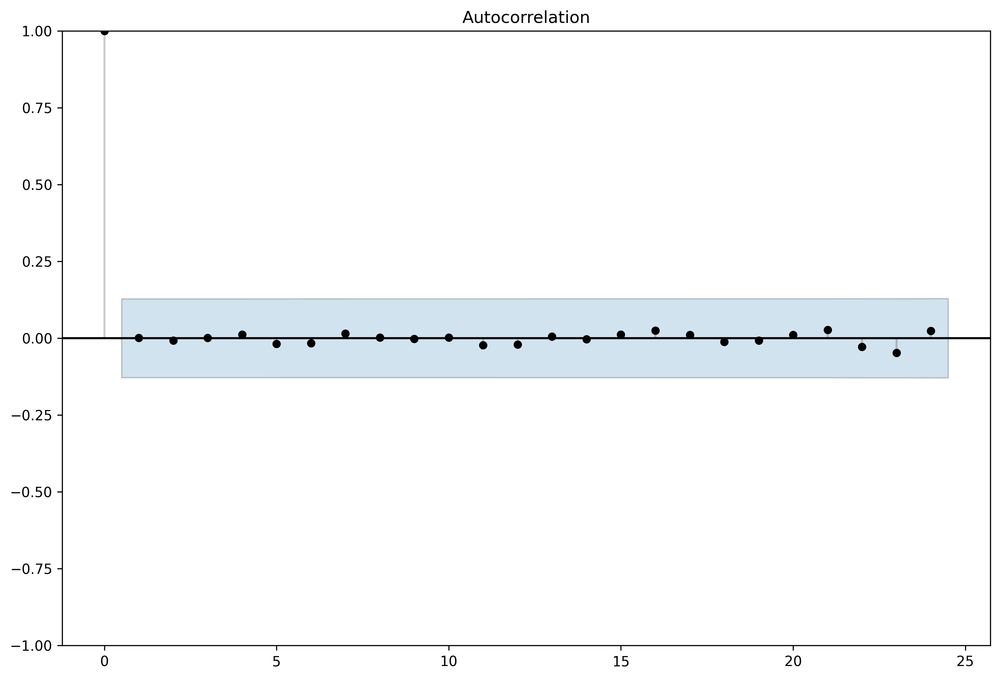

Autocorrelation résidus AR


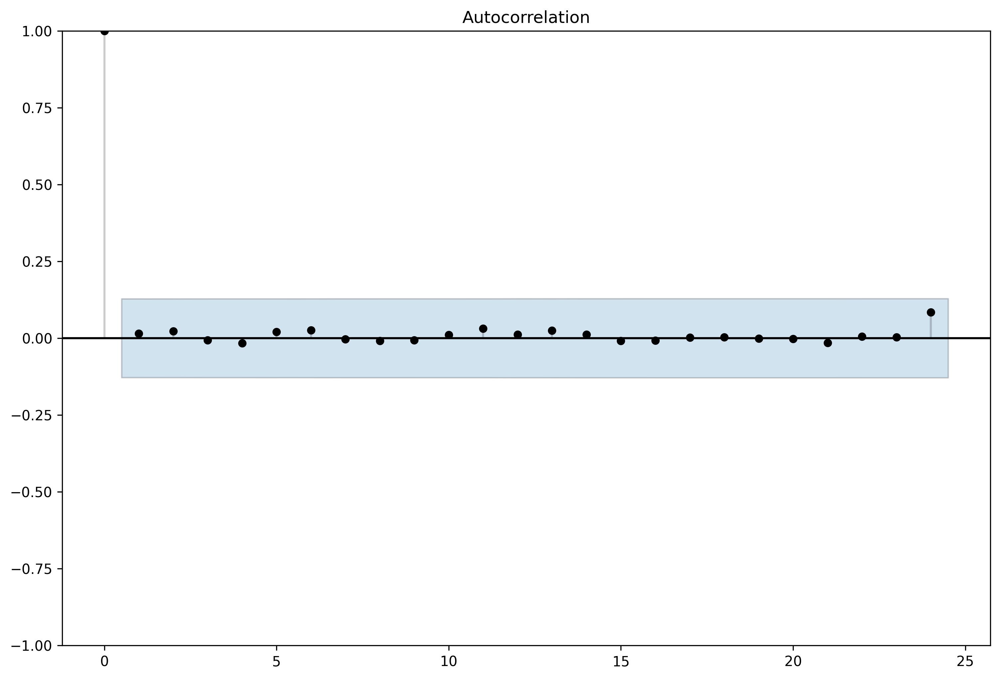

Autocorrelation résidus ARMA


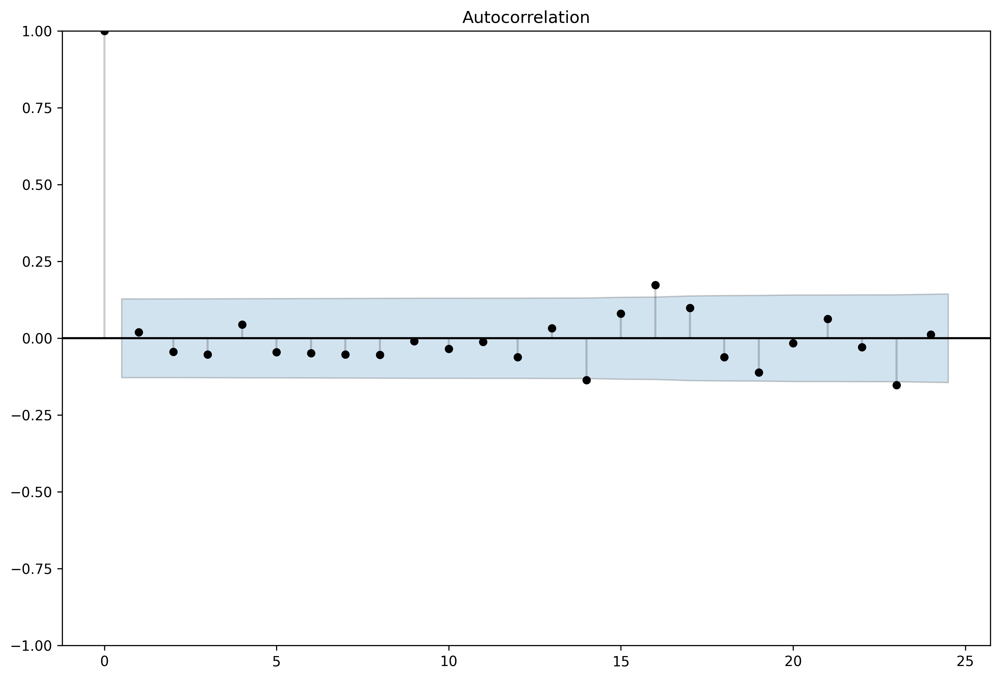

In [35]:
# Assuming results_ma, results_ar, results_arma are your model results
check_residuals_acf(results_ma.resid, 'MA')
check_residuals_acf(results_ar.resid, 'AR')
check_residuals_acf(results_arma.resid, 'ARMA')

In [36]:
import scipy.stats as stats

def check_residuals_normality(residus, title):
    # Histogram with black-bordered rectangles and normal distribution curve
    plt.figure(figsize=(12, 6))
    n, bins, patches = plt.hist(residus, bins=30, density=True, edgecolor='black', linewidth=1.2, facecolor='none')

    # Add normal distribution curve
    mu, std = stats.norm.fit(residus)
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = stats.norm.pdf(x, mu, std)
    plt.plot(x, p, 'k', linewidth=2)
    plt.title(f'Histogramme des Résidus - {title}')
    plt.show()

    # Q-Q plot with royal blue reference line and black data points
    plt.figure(figsize=(12, 6))
    (osm, osr), (slope, intercept, r) = stats.probplot(residus, dist="norm", plot=None)
    plt.scatter(osm, osr, facecolor='black')
    plt.plot(osm, slope*osm + intercept, 'royalblue', label='Ligne de Référence')
    plt.legend()
    plt.title(f'Diagramme Q-Q - {title}')
    plt.show()

    # Shapiro-Wilk test
    shapiro_test = stats.shapiro(residus)
    print(f"Résultats du Test de Shapiro-Wilk - {title} : {shapiro_test}")

    # Kolmogorov-Smirnov test
    ks_test = stats.kstest(residus, 'norm')
    print(f"Résultats du Test de Kolmogorov-Smirnov - {title} : {ks_test}")

    # Anderson-Darling test
    ad_test = stats.anderson(residus, 'norm')
    print(f"Résultats du Test d'Anderson-Darling - {title} : {ad_test}")

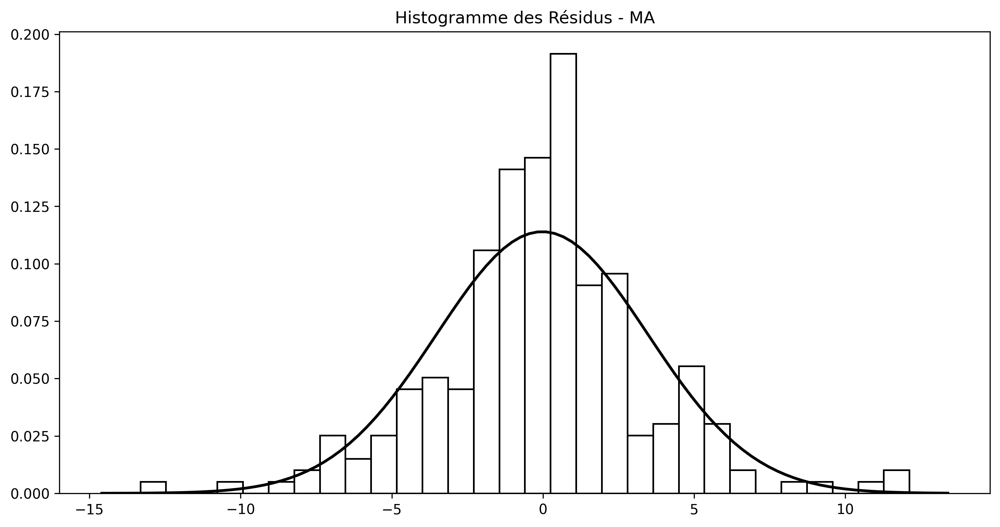

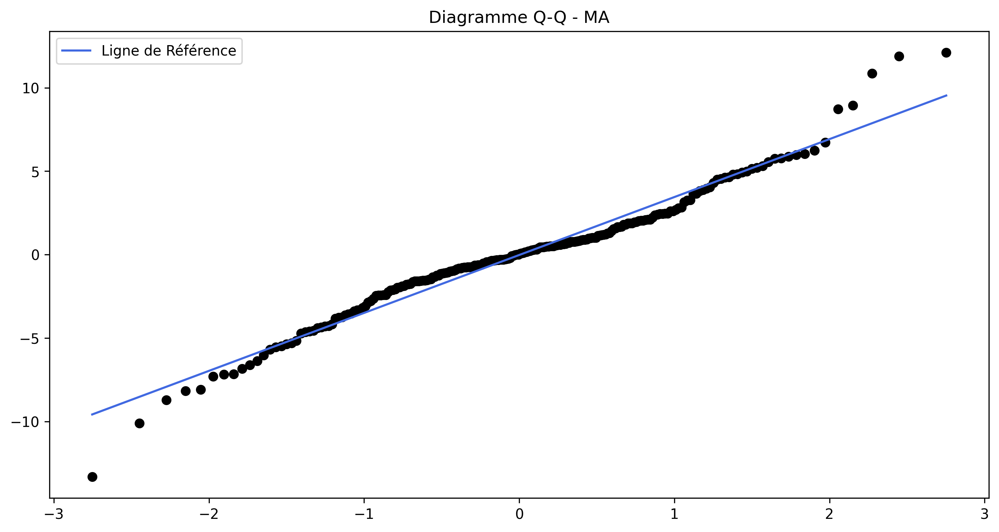

Résultats du Test de Shapiro-Wilk - MA : ShapiroResult(statistic=0.9693384170532227, pvalue=6.0490834584925324e-05)
Résultats du Test de Kolmogorov-Smirnov - MA : KstestResult(statistic=0.21555152618304518, pvalue=5.05199831785474e-10)
Résultats du Test d'Anderson-Darling - MA : AndersonResult(statistic=2.376742052211654, critical_values=array([0.567, 0.645, 0.774, 0.903, 1.074]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))


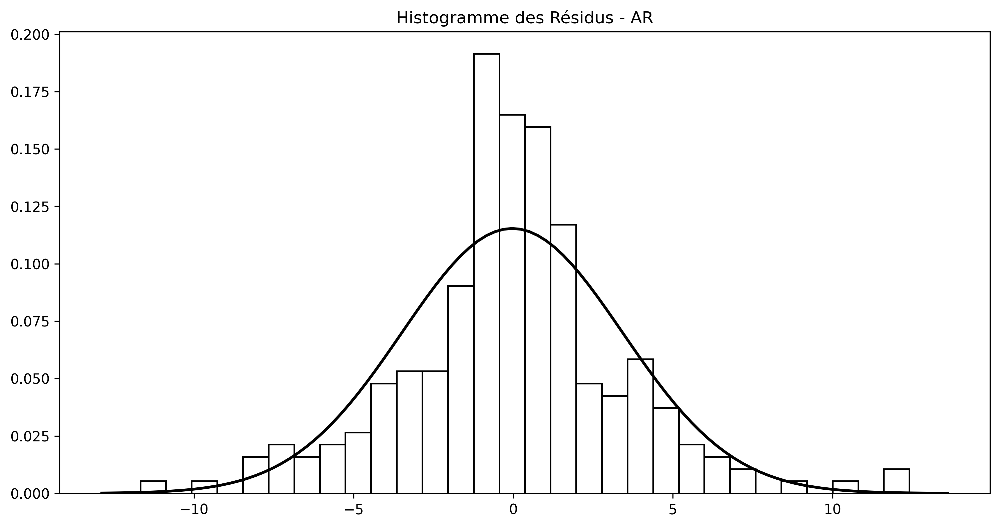

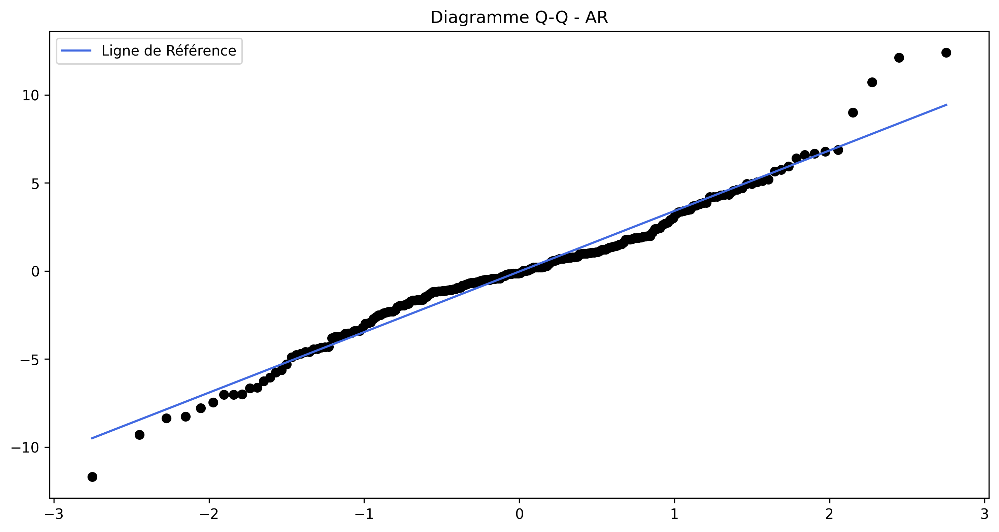

Résultats du Test de Shapiro-Wilk - AR : ShapiroResult(statistic=0.972924530506134, pvalue=0.000188497913768515)
Résultats du Test de Kolmogorov-Smirnov - AR : KstestResult(statistic=0.21642138889217016, pvalue=4.219481892236843e-10)
Résultats du Test d'Anderson-Darling - AR : AndersonResult(statistic=2.1181490906591307, critical_values=array([0.567, 0.645, 0.774, 0.903, 1.074]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))


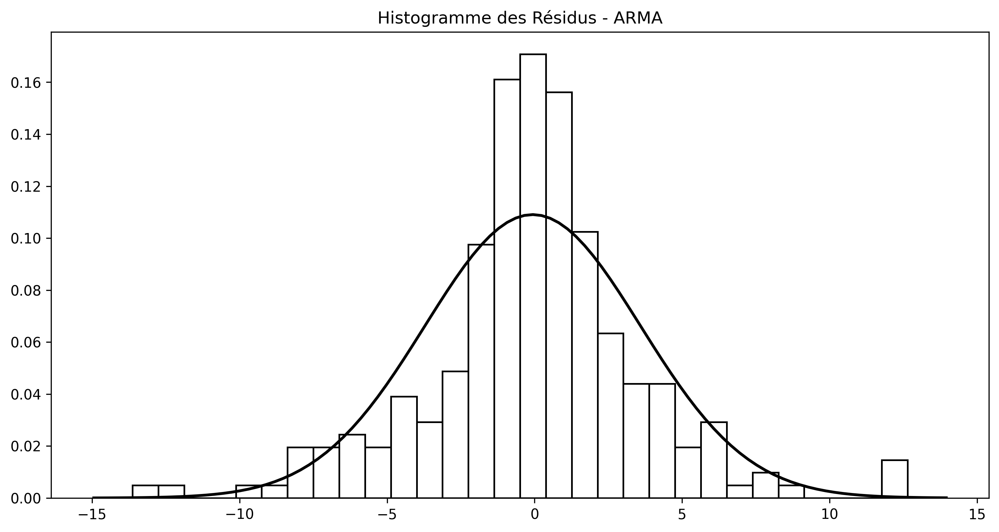

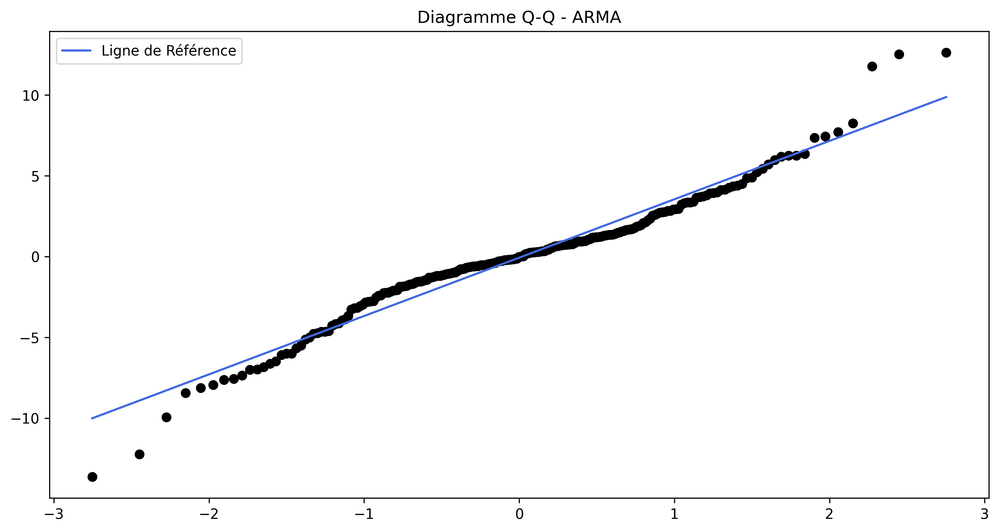

Résultats du Test de Shapiro-Wilk - ARMA : ShapiroResult(statistic=0.9611439108848572, pvalue=5.579596290772315e-06)
Résultats du Test de Kolmogorov-Smirnov - ARMA : KstestResult(statistic=0.20375305011136846, pvalue=5.3939040983284055e-09)
Résultats du Test d'Anderson-Darling - ARMA : AndersonResult(statistic=3.0440336306552354, critical_values=array([0.567, 0.645, 0.774, 0.903, 1.074]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))


In [37]:
# Verify residuals for each model
# Assuming residus_ma, residus_ar, residus_arma are your model residuals
check_residuals_normality(results_ma.resid, "MA")
check_residuals_normality(results_ar.resid, "AR")
check_residuals_normality(results_arma.resid, "ARMA")

In [38]:
print(data.columns)

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Dividends',
       'Stock Splits', 'Brand_Name', 'Ticker', 'Industry_Tag', 'Country'],
      dtype='object')


In [39]:
# Forecast for n_test steps ahead
forecast = results_arma.get_forecast(steps=n_test)
forecast_values = forecast.predicted_mean
forecast_conf_int = forecast.conf_int()

# Assuming that test_df's index is a datetime index and aligns with the forecast period
forecast_index = test_df.index

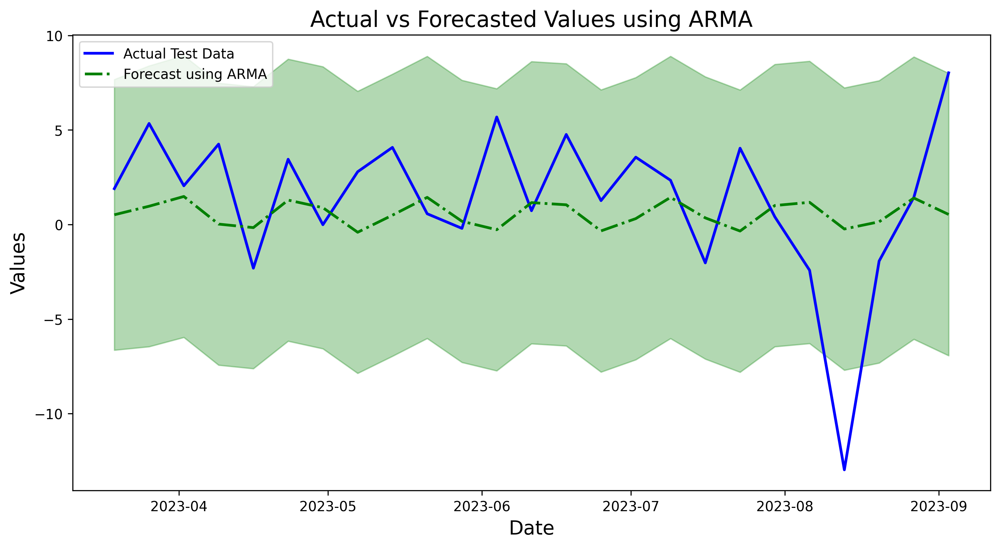

<Figure size 3600x2400 with 0 Axes>

In [40]:
# Plotting the results
plt.figure(figsize=(12, 6), dpi=300)

# Plot actual test data
plt.plot(test_df, label='Actual Test Data', color='blue', linestyle='-', linewidth=2)

# Plot forecasts
plt.plot(forecast_index, forecast_values, label='Forecast using ARMA', color='green', linestyle='-.', linewidth=2)

# Plot confidence intervals
plt.fill_between(forecast_index, forecast_conf_int.iloc[:, 0], forecast_conf_int.iloc[:, 1], color='green', alpha=0.3)

# Adding titles and labels
plt.title('Actual vs Forecasted Values using ARMA', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Values', fontsize=14)
plt.legend()

# Show the plot
plt.show()

# Optionally, save the plot
plt.savefig('forecast_vs_actual_ARMA.png', format='png', dpi=300)


In [41]:
# Define the brand and column names
brand_name = 'apple'
column_names = ['Open', 'High', 'Low', 'Volume']

# Dictionary to store the isolated columns
isolated_columns = {}

# Populate the dictionary with DataFrames for each stock attribute
for name in column_names:
    isolated_columns[name] = isolate_column(data, brand_name, name)

# Extract each DataFrame from the dictionary
apple_open = isolated_columns['Open']
apple_high = isolated_columns['High']
apple_low = isolated_columns['Low']
apple_volume = isolated_columns['Volume']


In [42]:
brands = ['apple', 'microsoft', 'google', 'cisco']
closing_prices = pd.DataFrame()

for brand in brands:
    weekly_close = isolate_column(data, brand, 'Close')
    closing_prices[brand + '_close'] = weekly_close['Close']
closing_prices.head()

,apple_close,microsoft_close,google_close,cisco_close
Date,,,,
2018-09-16,53.321823,105.848949,58.967699,40.513410
2018-09-23,52.300876,107.037022,58.649000,40.944971
2018-09-30,53.350076,108.363434,59.819500,41.660225
2018-10-07,54.633438,108.168259,59.725999,41.983895
2018-10-14,52.845827,103.222676,56.045300,39.894124


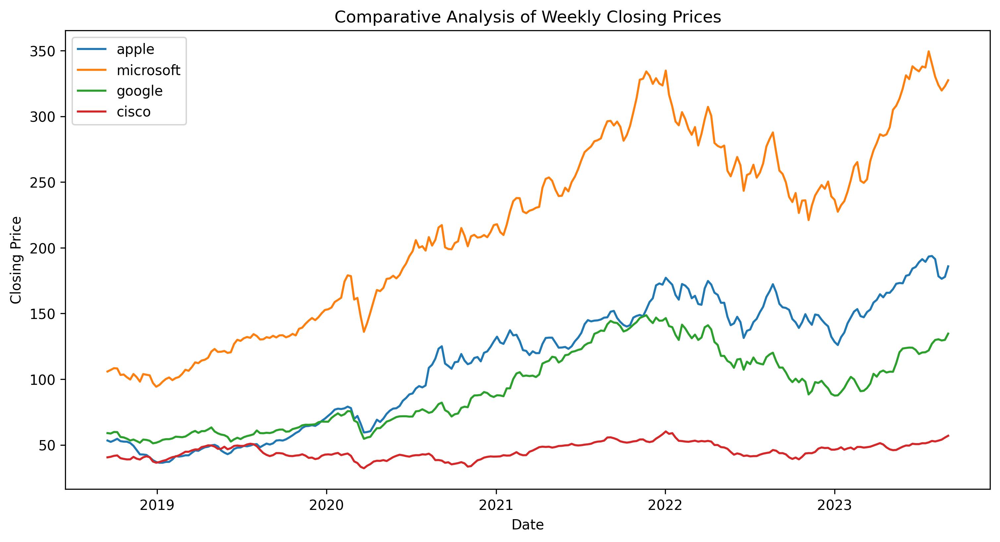

In [43]:
plt.figure(figsize=(12, 6))
for brand in brands:
    plt.plot(closing_prices[brand + '_close'], label=brand)

plt.title('Comparative Analysis of Weekly Closing Prices')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.legend()
plt.show()


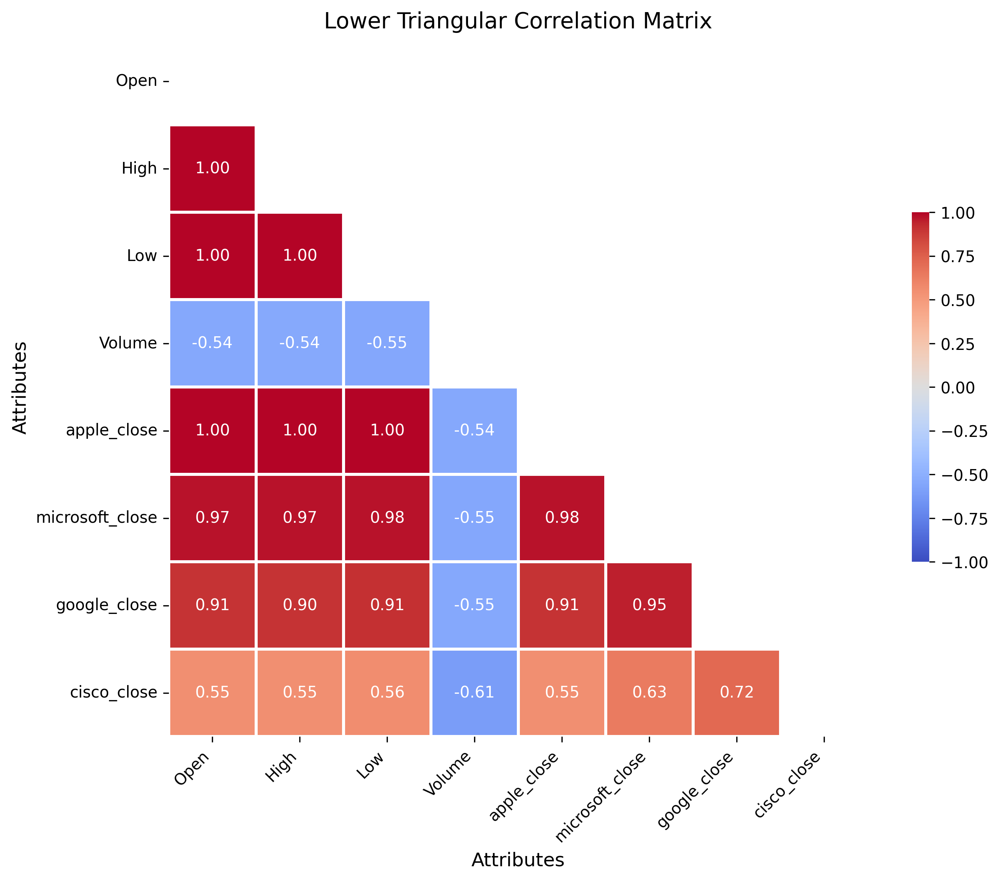

In [44]:
import seaborn as sns

# Assuming apple_open, apple_high, apple_low, apple_volume, and closing_prices are defined DataFrames

# Concatenate apple data with closing_prices
explain_apple_close = pd.concat([apple_open, apple_high, apple_low, apple_volume, closing_prices], axis=1)

# Calculate the correlation matrix
correlation_matrix = explain_apple_close.corr()

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Draw the heatmap with the mask
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='coolwarm', vmax=1, vmin=-1,
            square=True, linewidths=1.5, cbar_kws={"shrink": .5}, fmt=".2f")

# Rotate the x-axis and y-axis labels for readability
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Add titles and labels
plt.title("Lower Triangular Correlation Matrix", fontsize=14)
plt.xlabel("Attributes", fontsize=12)
plt.ylabel("Attributes", fontsize=12)

plt.show()


In [45]:
print(explain_apple_close.columns)

Index(['Open', 'High', 'Low', 'Volume', 'apple_close', 'microsoft_close',
       'google_close', 'cisco_close'],
      dtype='object')


In [46]:
# Example usage
brand_name = ['google', 'microsoft', 'apple']
column_name = ['Close', 'Volume']
google_close = isolate_column(data, brand_name[0], column_name[0])
microsoft_close = isolate_column(data, brand_name[1], column_name[0])
trading_volume = isolate_column(data, brand_name[2], column_name[1])

In [47]:
print("google ADF-Test")
perform_adf_test(google_close, 'Close')
print("microsoft ADF-Test")
perform_adf_test(microsoft_close, 'Close')
print("Apple trading Volume ADF-Test")
perform_adf_test(trading_volume, 'Volume')


google ADF-Test
Test Statistic                  -0.792211
p_value                          0.821399
#Lags Used                       1.000000
Number of Observations Used    258.000000
Critical Value (1%)             -3.455953
Critical Value (5%)             -2.872809
Critical Value (10%)            -2.572775
dtype: float64

===> The time series is not stationary.
microsoft ADF-Test
Test Statistic                  -0.833539
p_value                          0.809071
#Lags Used                       1.000000
Number of Observations Used    258.000000
Critical Value (1%)             -3.455953
Critical Value (5%)             -2.872809
Critical Value (10%)            -2.572775
dtype: float64

===> The time series is not stationary.
Apple trading Volume ADF-Test
Test Statistic                  -2.387410
p_value                          0.145321
#Lags Used                      13.000000
Number of Observations Used    246.000000
Critical Value (1%)             -3.457215
Critical Value (5%)      

In [48]:
# Apply differentiation
google_diff = google_close['Close'].diff().dropna()
microsoft_diff = microsoft_close['Close'].diff().dropna()
volume_diff = trading_volume['Volume'].diff().dropna()

In [49]:
print(microsoft_diff.isna().sum())  # Vérifiez les valeurs NaN
print(microsoft_diff.isin([np.inf, -np.inf]).sum())  # Vérifiez les valeurs infinies

0
0


In [50]:
# Perform ADF test on the differentiated data
print("google ADF-Test aprés diff")
perform_adf_test(pd.DataFrame(google_diff), google_diff.name)
print("microsoft ADF-Test aprés diff")
perform_adf_test(pd.DataFrame(microsoft_diff), microsoft_diff.name)
print("volume ADF-Test aprés diff")
perform_adf_test(pd.DataFrame(volume_diff), volume_diff.name)

google ADF-Test aprés diff
Test Statistic                -1.349225e+01
p_value                        3.089910e-25
#Lags Used                     0.000000e+00
Number of Observations Used    2.580000e+02
Critical Value (1%)           -3.455953e+00
Critical Value (5%)           -2.872809e+00
Critical Value (10%)          -2.572775e+00
dtype: float64

===> The time series is stationary.
microsoft ADF-Test aprés diff
Test Statistic                -1.359755e+01
p_value                        1.981652e-25
#Lags Used                     0.000000e+00
Number of Observations Used    2.580000e+02
Critical Value (1%)           -3.455953e+00
Critical Value (5%)           -2.872809e+00
Critical Value (10%)          -2.572775e+00
dtype: float64

===> The time series is stationary.
volume ADF-Test aprés diff
Test Statistic                -6.055915e+00
p_value                        1.245326e-07
#Lags Used                     1.600000e+01
Number of Observations Used    2.420000e+02
Critical Value (1%) 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


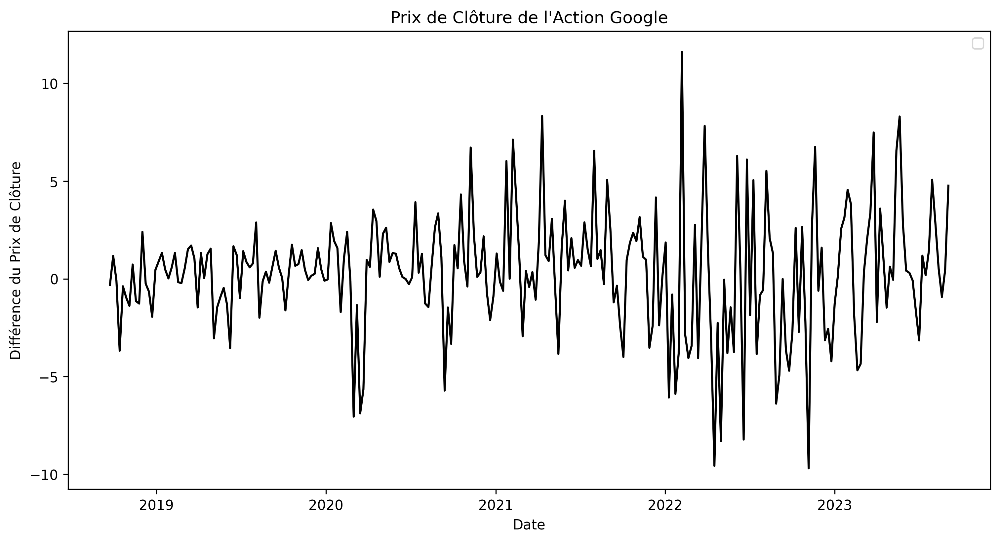

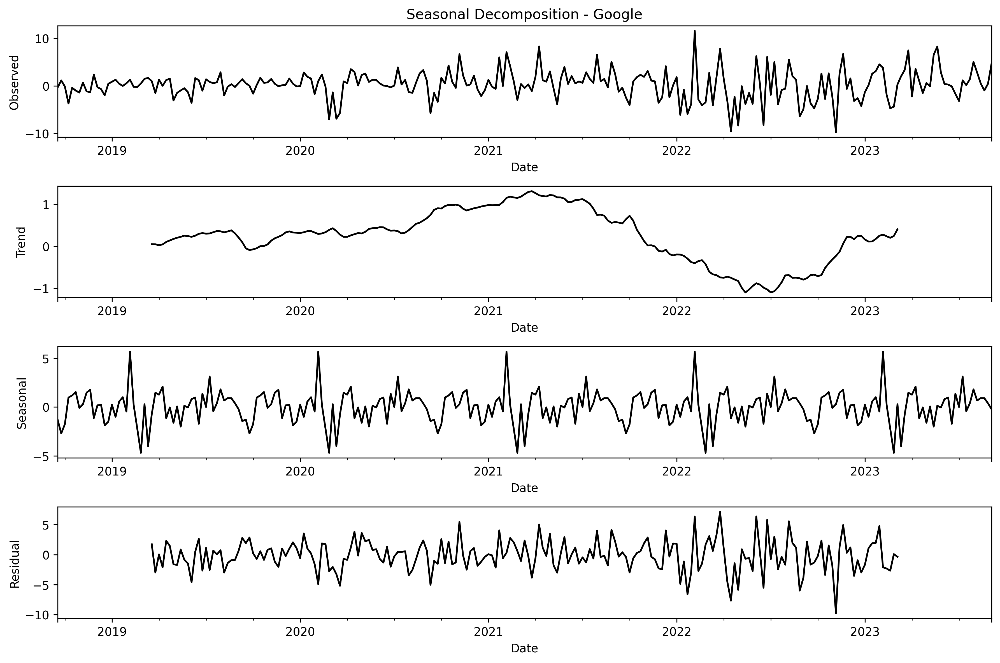

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


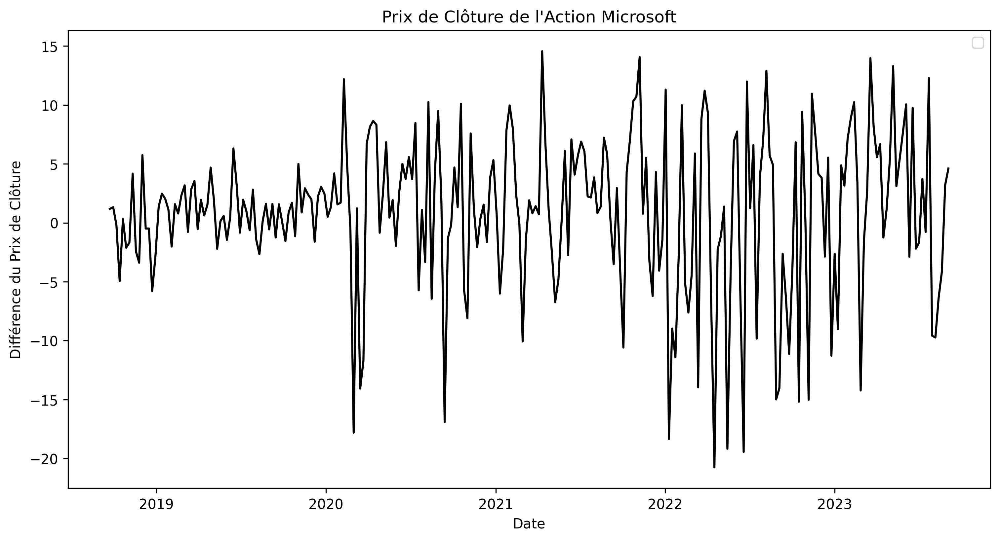

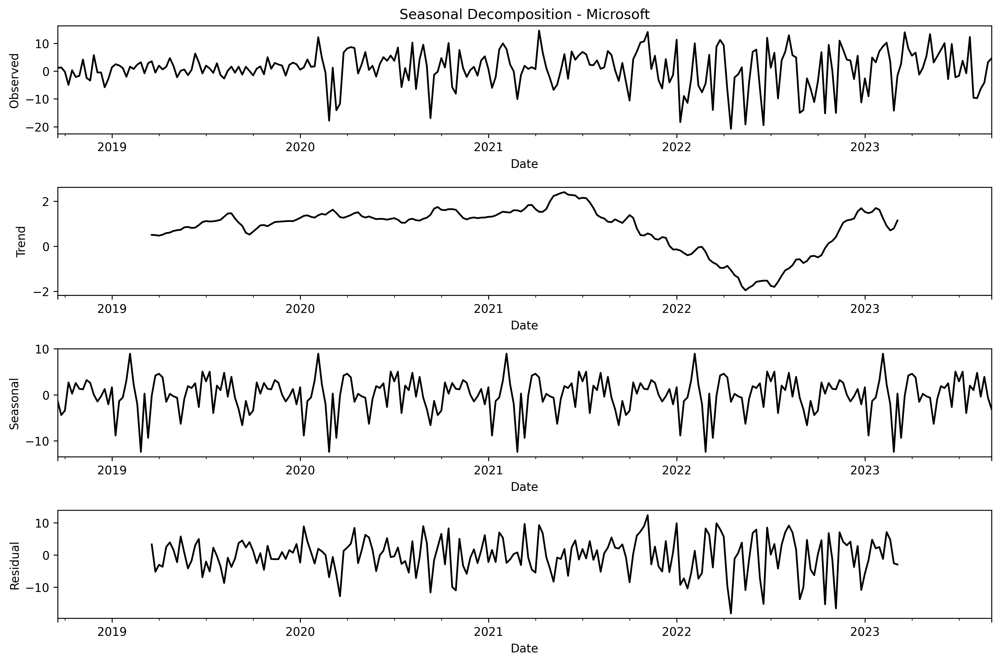

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


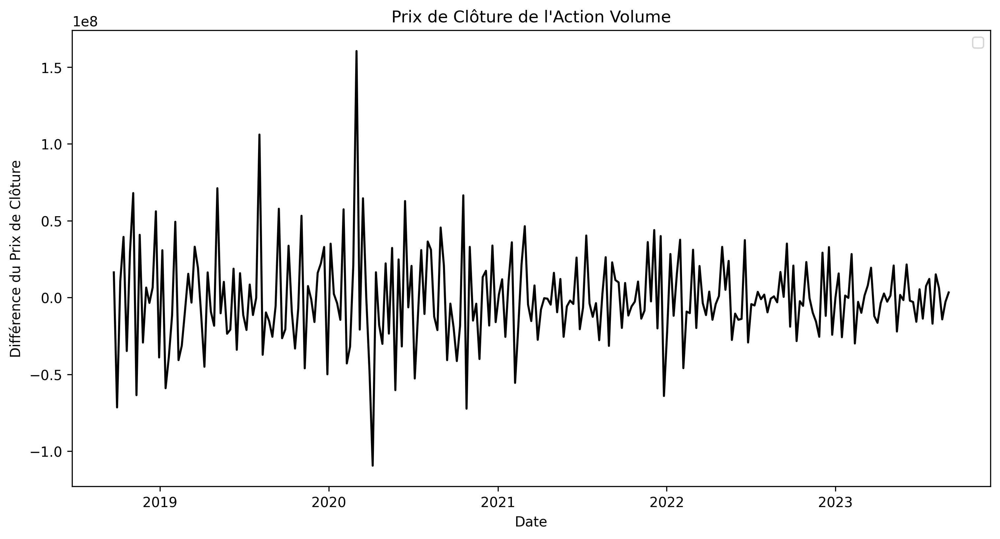

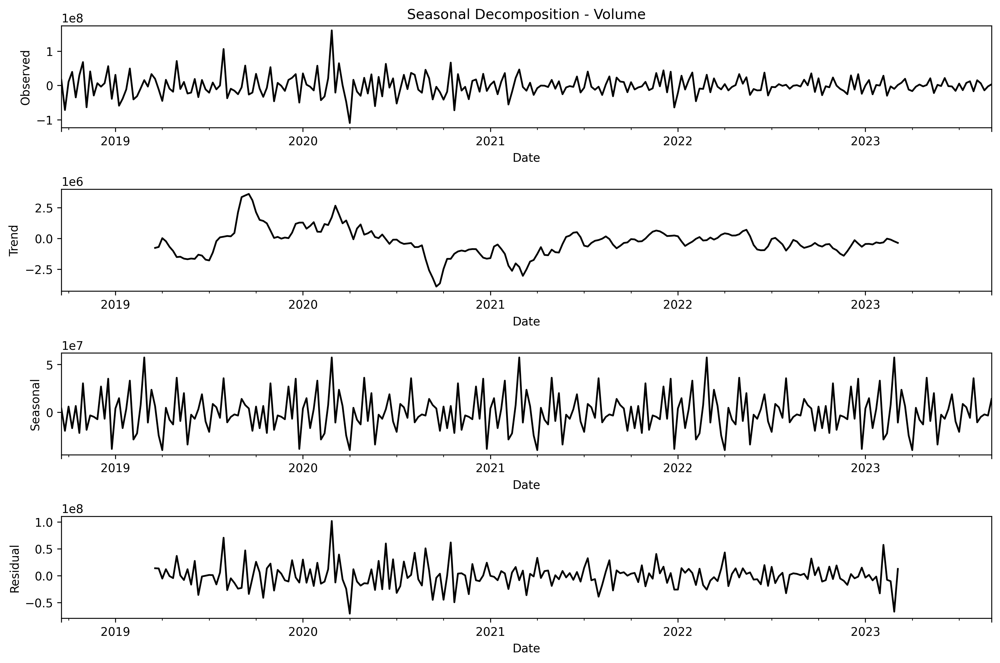

In [51]:
# google_diff and microsoft_diff are  DataFrame objects
dataframes = {
    'Google': google_diff,
    'Microsoft': microsoft_diff,
    'Volume': volume_diff
}

for name, diff in dataframes.items():
    # Plotting the differentiated data
    plt.figure(figsize=(12, 6), dpi=300)
    plt.plot(diff, color='black')
    plt.title(f"Prix de Clôture de l'Action {name}")
    plt.xlabel('Date')
    plt.ylabel('Différence du Prix de Clôture')
    plt.legend()
    plt.show()
    
    # Seasonal decomposition of the differentiated data
    decomposition_diff = sm.tsa.seasonal_decompose(diff, model='additive')
    
    # Get the decomposition plot
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8))
    
    # Plotting each component
    decomposition_diff.observed.plot(ax=ax1, color='black')
    ax1.set_ylabel('Observed', color='black')
    ax1.set_title(f'Seasonal Decomposition - {name}')
    
    decomposition_diff.trend.plot(ax=ax2, color='black')
    ax2.set_ylabel('Trend', color='black')
    
    decomposition_diff.seasonal.plot(ax=ax3, color='black')
    ax3.set_ylabel('Seasonal', color='black')
    
    decomposition_diff.resid.plot(ax=ax4, color='black')
    ax4.set_ylabel('Residual', color='black')
    
    # Adjusting layout for better display
    plt.tight_layout()
    plt.show()


In [52]:
g_train_df, g_test_df, n_test = split_time_series(google_diff, 'Close', 0.10)
g_train_df.head()
m_train_df, m_test_df, n_test = split_time_series(microsoft_diff, 'Close', 0.10)
m_train_df.head()
v_train_df, v_test_df, v_test = split_time_series(volume_diff, 'Volume', 0.10)
m_train_df.head()

Date
2018-09-23    1.188074
2018-09-30    1.326411
2018-10-07   -0.195175
2018-10-14   -4.945583
2018-10-21    0.325911
Freq: W-SUN, Name: Close, dtype: float64

In [53]:
# Vérifier si des valeurs sont manquantes ou infinies
X = pd.concat([g_train_df, m_train_df,v_train_df], axis=1)
print(X.isna().sum())
print(X.isin([np.inf, -np.inf]).sum())

Close     0
Close     0
Volume    0
dtype: int64
Close     0
Close     0
Volume    0
dtype: int64


In [54]:
import statsmodels.api as sm
import pandas as pd

# Assuming 'train_df', 'g_train_df', 'm_train_df' are Pandas Series

# Set the target variable (Apple's closing price)
y = train_df  # This is your target series

# Combine the exogenous variables (Google's and Microsoft's closing prices) into a DataFrame
X = pd.concat([g_train_df, m_train_df,v_train_df], axis=1)

# Give meaningful column names to X
X.columns = ['google_close', 'microsoft_close','trading_volume']


In [55]:
import itertools
warnings.filterwarnings("ignore")  # Ignore convergence warnings

# Define the range for ARIMA parameters
p = d = q = range(0, 5)

pdq = list(itertools.product(p, d, q))

# Assuming non-seasonal model
best_aic = float('inf')
best_params = None

for param in pdq:
    try:
        model = sm.tsa.SARIMAX(y, exog=X, order=param)
        results = model.fit()

        if results.aic < best_aic:
            best_aic = results.aic
            best_params = param
    except:
        continue

print("Best SARIMAX parameters:", best_params, "Best AIC:", best_aic)


Best SARIMAX parameters: (0, 0, 3) Best AIC: 1093.3830794972068


In [74]:
# Fit the SARIMAX model
model_SARIMAX = sm.tsa.SARIMAX(y, exog=X, order=(0, 0, 3))
results_SARIMAX = model_SARIMAX.fit()

# Print the summary of the model
print(results_SARIMAX.summary())

                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  234
Model:               SARIMAX(0, 0, 3)   Log Likelihood                -539.692
Date:                Wed, 13 Dec 2023   AIC                           1093.383
Time:                        00:02:36   BIC                           1117.570
Sample:                    09-23-2018   HQIC                          1103.135
                         - 03-12-2023                                         
Covariance Type:                  opg                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
google_close        0.3228      0.067      4.831      0.000       0.192       0.454
microsoft_close     0.3422      0.029     11.669      0.000       0.285       0.400
trading_volume   1.522e-08   6.1

In [75]:
# Matrice de covariance des erreurs de prédiction
print("Matrice de Covariance des Erreurs de Prédiction:")
print(results_SARIMAX.cov_params())

# Afficher la variance des résidus (estimation de la variance des innovations)
print("Variance des Résidus (Estimation de la Variance des Innovations):")
print(results_SARIMAX.resid.var())


Matrice de Covariance des Erreurs de Prédiction:
                 google_close  microsoft_close  trading_volume         ma.L1  \
google_close     4.464803e-03    -1.415431e-03    2.193522e-10  1.185686e-03   
microsoft_close -1.415431e-03     8.602002e-04   -4.348791e-11 -2.745106e-04   
trading_volume   2.193522e-10    -4.348791e-11    3.825492e-17  4.201631e-11   
ma.L1            1.185686e-03    -2.745106e-04    4.201631e-11  4.126295e-03   
ma.L2            3.323763e-04    -2.006710e-04    6.302044e-12  7.107703e-04   
ma.L3           -1.541147e-04    -9.364521e-05    3.217084e-12 -2.668790e-05   
sigma2          -1.012877e-04     3.835275e-05   -4.643289e-12 -6.179261e-05   

                        ma.L2         ma.L3        sigma2  
google_close     3.323763e-04 -1.541147e-04 -1.012877e-04  
microsoft_close -2.006710e-04 -9.364521e-05  3.835275e-05  
trading_volume   6.302044e-12  3.217084e-12 -4.643289e-12  
ma.L1            7.107703e-04 -2.668790e-05 -6.179261e-05  
ma.L2     

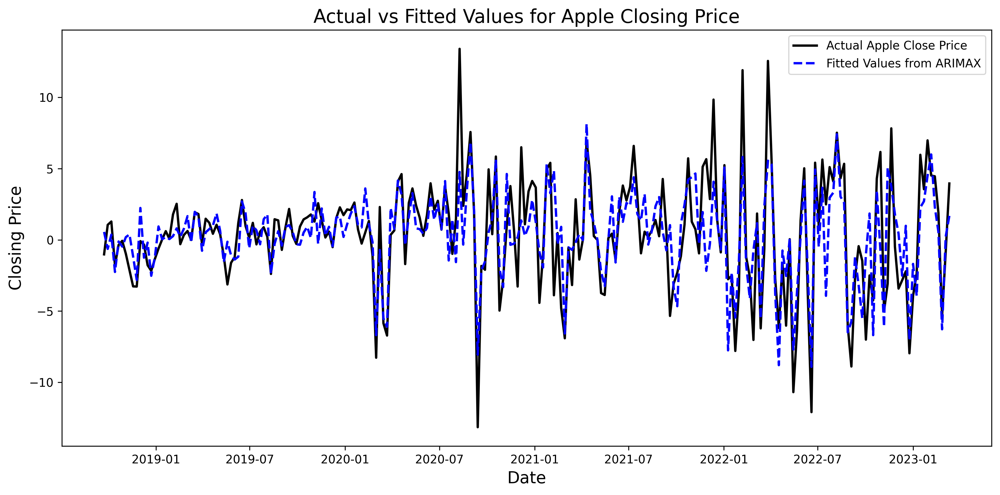

<Figure size 3600x2400 with 0 Axes>

In [76]:
# Extract the fitted values
fitted_values_SARIMAX = results_SARIMAX.fittedvalues

# Create a high-resolution plot
plt.figure(figsize=(12, 6), dpi=300)

# Plotting the actual and fitted values
plt.plot(y, label='Actual Apple Close Price', color='black', linewidth=2)
plt.plot(fitted_values_SARIMAX, label='Fitted Values from ARIMAX', color='blue', linestyle='--', linewidth=2)

# Adding titles and labels
plt.title('Actual vs Fitted Values for Apple Closing Price', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Closing Price', fontsize=14)

# Add legend
plt.legend()

# Enhance layout
plt.tight_layout()

# Show the plot
plt.show()

# Optionally, save the plot as a high-quality PNG file
plt.savefig('arimax_fitted_values.png', format='png', dpi=300)


In [77]:
# Forecast for n_test steps ahead
X_future = pd.concat([g_test_df, m_test_df,v_test_df], axis=1)
forecast_SARIMAX = results_SARIMAX.get_forecast(steps=n_test, exog=X_future)
forecast_values_SARIMAX = forecast_SARIMAX.predicted_mean
forecast_conf_int_SARIMAX = forecast_SARIMAX.conf_int()

# Assuming that test_df's index is a datetime index and aligns with the forecast period
forecast_index = test_df.index

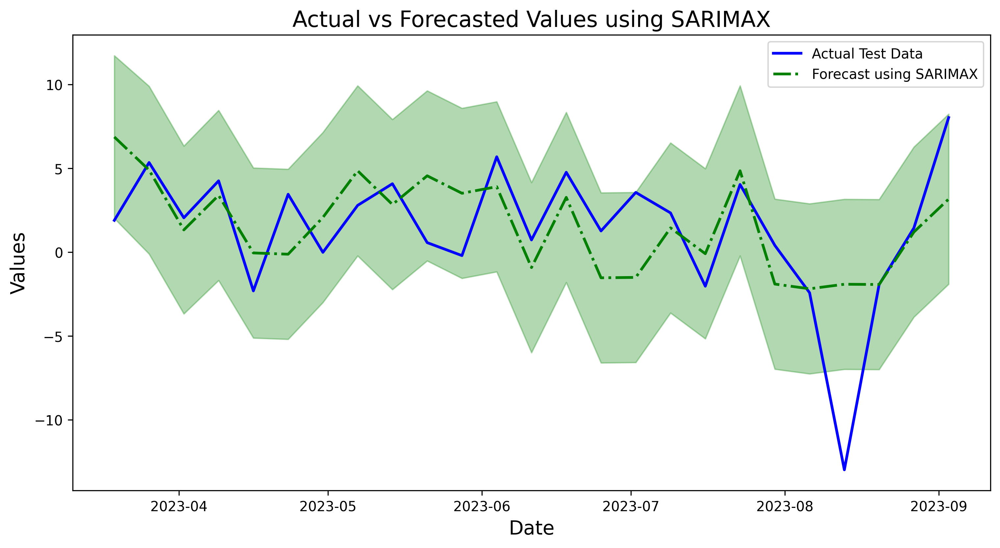

In [78]:
# Plotting the results
plt.figure(figsize=(12, 6), dpi=300)

# Plot actual test data
plt.plot(test_df, label='Actual Test Data', color='blue', linestyle='-', linewidth=2)

# Plot forecasts
plt.plot(forecast_index, forecast_values_SARIMAX, label='Forecast using SARIMAX', color='green', linestyle='-.', linewidth=2)

# Plot confidence intervals
plt.fill_between(forecast_index, forecast_conf_int_SARIMAX.iloc[:, 0], forecast_conf_int_SARIMAX.iloc[:, 1], color='green', alpha=0.3)

# Adding titles and labels
plt.title('Actual vs Forecasted Values using SARIMAX', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Values', fontsize=14)
plt.legend()

# Show the plot
plt.show()


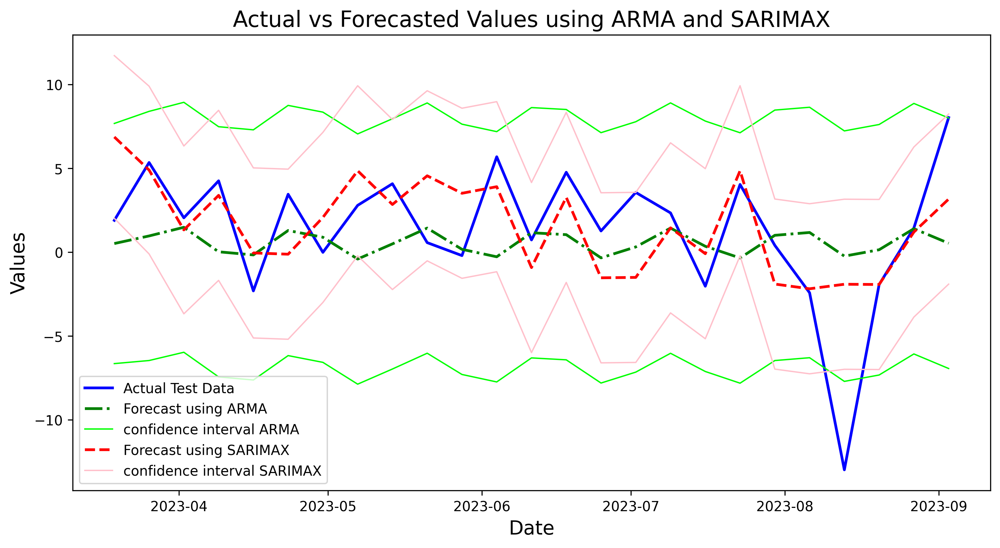

<Figure size 3600x2400 with 0 Axes>

In [82]:
# Creating the figure and axes
plt.figure(figsize=(12, 6), dpi=300)

# Plot actual test data
plt.plot(test_df, label='Actual Test Data', color='blue', linestyle='-', linewidth=2)

# Plot ARMA forecasts
plt.plot(forecast_index, forecast_values, label='Forecast using ARMA', color='green', linestyle='-.', linewidth=2)
# Plot upper and lower bounds of the confidence interval
plt.plot(forecast_index, forecast_conf_int.iloc[:, 0], label='confidence interval ARMA', color='lime', linestyle='-', linewidth=1)
plt.plot(forecast_index, forecast_conf_int.iloc[:, 1], color='lime', linestyle='-', linewidth=1)

# Adding titles and labels

# Plot SARIMAX forecasts
plt.plot(forecast_index, forecast_values_SARIMAX, label='Forecast using SARIMAX', color='red', linestyle='--', linewidth=2)
# Plot upper and lower bounds of the confidence interval
plt.plot(forecast_index, forecast_conf_int_SARIMAX.iloc[:, 0], label='confidence interval SARIMAX', color='pink', linestyle='-', linewidth=1)
plt.plot(forecast_index, forecast_conf_int_SARIMAX.iloc[:, 1], color='pink', linestyle='-', linewidth=1)

# Adding titles and labels
plt.title('Actual vs Forecasted Values using ARMA and SARIMAX', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Values', fontsize=14)
plt.legend()

# Show the plot
plt.show()

# Optionally, save the plot
plt.savefig('forecast_vs_actual_ARMA_SARIMAX.png', format='png', dpi=300)
